In [1]:
#Importing all relevant libraries
import numpy as np
import pandas as pd
import os
import folium
from folium import plugins

In [2]:
#Using Department of Education APIs to read in all relevant data
sat_results = pd.read_json("https://data.cityofnewyork.us/resource/f9bf-2cp4.json")
enrollment = pd.read_json("https://data.cityofnewyork.us/resource/7z8d-msnt.json")
high_schools = pd.read_json("https://data.cityofnewyork.us/resource/n3p6-zve2.json")
class_size = pd.read_json("https://data.cityofnewyork.us/resource/urz7-pzb3.json")
ap2010 = pd.read_json("https://data.cityofnewyork.us/resource/itfs-ms3e.json")
graduation = pd.read_json("https://data.cityofnewyork.us/resource/vh2h-md7a.json")
demographics = pd.read_json("https://data.cityofnewyork.us/resource/ihfw-zy9j.json")
districts = pd.read_json("https://data.cityofnewyork.us/resource/cuae-wd7h.json")
math_results = pd.read_json("https://data.cityofnewyork.us/resource/jufi-gzgp.json")
survey_1 = pd.read_csv("masterfile11_gened_final.txt",delimiter='\t',encoding='windows-1252')
survey_2 = pd.read_csv("masterfile11_d75_final.txt",delimiter='\t',encoding='windows-1252')

In [3]:
#Browsing the datasets one by one
sat_results.head()

,dbn,num_of_sat_test_takers,sat_critical_reading_avg_score,sat_math_avg_score,sat_writing_avg_score,school_name
0,01M292,29,355,404,363,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES
1,01M448,91,383,423,366,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL
2,01M450,70,377,402,370,EAST SIDE COMMUNITY SCHOOL
3,01M458,7,414,401,359,FORSYTH SATELLITE ACADEMY
4,01M509,44,390,433,384,MARTA VALLE HIGH SCHOOL


In [4]:
enrollment.head()

,district,ytd_attendance_avg_,ytd_enrollment_avg_
0,DISTRICT 01,91.18,12367
1,DISTRICT 02,89.01,60823
2,DISTRICT 03,89.28,21962
3,DISTRICT 04,91.13,14252
4,DISTRICT 05,89.08,13170


In [5]:
high_schools.head()

,:@computed_region_92fq_4b7q,:@computed_region_efsh_h5xi,:@computed_region_f5dn_yrer,:@computed_region_sbqj_enih,:@computed_region_yeji_bk3q,addtl_info1,addtl_info2,advancedplacement_courses,bbl,bin,...,school_name,school_sports,school_type,se_services,start_time,state_code,subway,total_students,website,zip
0,47,20529.0,51,59,3,"Uniform Required: plain white collared shirt, ...","Extended Day Program, Student Summer Orientati...","Calculus AB, English Language and Composition,...",4.157360e+09,4300730.0,...,Frederick Douglass Academy VI High School,"Step Team, Modern Dance, Hip Hop Dance",NaN,This school will provide students with disabil...,2020-04-28 07:45:00,NY,A to Beach 25th St-Wavecrest,412.0,http://schools.nyc.gov/schoolportals/27/Q260,11691
1,45,17616.0,21,35,2,Our school requires completion of a Common Cor...,NaN,NaN,3.068830e+09,3186454.0,...,Life Academy High School for Film and Music,NaN,NaN,This school will provide students with disabil...,2020-04-28 08:15:00,NY,D to 25th Ave ; N to Ave U ; N to Gravesend - ...,260.0,http://schools.nyc.gov/schoolportals/21/K559,11214
2,49,18181.0,69,52,2,"Dress Code Required: solid white shirt/blouse,...","Student Summer Orientation, Weekend Program of...","English Language and Composition, United State...",3.016160e+09,3393805.0,...,Frederick Douglass Academy IV Secondary School,Basketball Team,NaN,This school will provide students with disabil...,2020-04-28 08:00:00,NY,"J to Kosciusko St ; M, Z to Myrtle Ave",155.0,http://schools.nyc.gov/schoolportals/16/K393,11221
3,31,11611.0,58,26,5,All students are individually programmed (base...,Extended Day Program,"Art History, English Language and Composition,...",2.036040e+09,2022205.0,...,Pablo Neruda Academy,"Baseball, Basketball, Flag Football, Soccer, S...",NaN,This school will provide students with disabil...,2020-04-28 08:00:00,NY,N/A,335.0,www.pablonerudaacademy.org,10473
4,19,12420.0,20,12,4,Chancellor’s Arts Endorsed Diploma,NaN,"Art History, Biology, Calculus AB, Calculus BC...",1.011560e+09,1030341.0,...,Fiorello H. LaGuardia High School of Music & A...,NaN,Specialized School,This school will provide students with disabil...,2020-04-28 08:00:00,NY,"1 to 66th St - Lincoln Center ; 2, 3 to 72nd S...",2730.0,www.laguardiahs.org,10023


In [6]:
class_size.head()

,average_class_size,borough,core_course_ms_core_and_9_12_only_,core_subject_ms_core_and_9_12_only_,csd,data_source,grade_,number_of_sections,number_of_students_seats_filled,program_type,school_code,school_name,schoolwide_pupil_teacher_ratio,service_category_k_9_only_,size_of_largest_class,size_of_smallest_class
0,19.0,M,-,-,1,ATS,0K,1.0,19.0,GEN ED,M015,P.S. 015 Roberto Clemente,NaN,-,19.0,19.0
1,21.0,M,-,-,1,ATS,0K,1.0,21.0,CTT,M015,P.S. 015 Roberto Clemente,NaN,-,21.0,21.0
2,17.0,M,-,-,1,ATS,01,1.0,17.0,GEN ED,M015,P.S. 015 Roberto Clemente,NaN,-,17.0,17.0
3,17.0,M,-,-,1,ATS,01,1.0,17.0,CTT,M015,P.S. 015 Roberto Clemente,NaN,-,17.0,17.0
4,15.0,M,-,-,1,ATS,02,1.0,15.0,GEN ED,M015,P.S. 015 Roberto Clemente,NaN,-,15.0,15.0


In [7]:
ap2010.head()

,ap_test_takers_,dbn,number_of_exams_with_scores_3_4_or_5,schoolname,total_exams_taken
0,39.0,01M448,10.0,UNIVERSITY NEIGHBORHOOD H.S.,49.0
1,19.0,01M450,NaN,EAST SIDE COMMUNITY HS,21.0
2,24.0,01M515,24.0,LOWER EASTSIDE PREP,26.0
3,255.0,01M539,191.0,"NEW EXPLORATIONS SCI,TECH,MATH",377.0
4,NaN,02M296,NaN,High School of Hospitality Management,NaN


In [8]:
graduation.head()

,advanced_regents_n,advanced_regents_of_cohort,advanced_regents_of_grads,cohort,dbn,demographic,dropped_out_n,dropped_out_of_cohort,local_n,local_of_cohort,...,regents_w_o_advanced_of_grads,school_name,still_enrolled_n,still_enrolled_of_cohort,total_cohort,total_grads_n,total_grads_of_cohort,total_regents_n,total_regents_of_cohort,total_regents_of_grads
0,s,NaN,NaN,2003,01M292,Total Cohort,s,NaN,s,NaN,...,NaN,HENRY STREET SCHOOL FOR INTERNATIONAL,s,NaN,5,s,NaN,s,NaN,NaN
1,0,0.0,0.0,2004,01M292,Total Cohort,3,5.5,20,36.4,...,45.9,HENRY STREET SCHOOL FOR INTERNATIONAL,15,27.3,55,37,67.3,17,30.9,45.9
2,0,0.0,0.0,2005,01M292,Total Cohort,9,14.1,16,25.0,...,62.8,HENRY STREET SCHOOL FOR INTERNATIONAL,9,14.1,64,43,67.2,27,42.2,62.8
3,0,0.0,0.0,2006,01M292,Total Cohort,11,14.1,7,9.0,...,83.7,HENRY STREET SCHOOL FOR INTERNATIONAL,16,20.5,78,43,55.1,36,46.2,83.7
4,0,0.0,0.0,2006 Aug,01M292,Total Cohort,11,14.1,7,9.0,...,84.1,HENRY STREET SCHOOL FOR INTERNATIONAL,15,19.2,78,44,56.4,37,47.4,84.1


In [9]:
demographics.head()

,asian_num,asian_per,black_num,black_per,ctt_num,dbn,ell_num,ell_percent,female_num,female_per,...,male_per,name,prek,schoolyear,selfcontained_num,sped_num,sped_percent,total_enrollment,white_num,white_per
0,10,3.6,74,26.3,25,01M015,36,12.8,123.0,43.8,...,56.2,P.S. 015 ROBERTO CLEMENTE,15,20052006,9,57.0,20.3,281,5,1.8
1,18,7.4,68,28.0,19,01M015,38,15.6,103.0,42.4,...,57.6,P.S. 015 ROBERTO CLEMENTE,15,20062007,15,55.0,22.6,243,4,1.6
2,16,6.1,77,29.5,20,01M015,52,19.9,118.0,45.2,...,54.8,P.S. 015 ROBERTO CLEMENTE,18,20072008,14,60.0,23.0,261,7,2.7
3,16,6.3,75,29.8,21,01M015,48,19.0,103.0,40.9,...,59.1,P.S. 015 ROBERTO CLEMENTE,17,20082009,17,62.0,24.6,252,7,2.8
4,16,7.7,67,32.2,14,01M015,40,19.2,84.0,40.4,...,59.6,P.S. 015 ROBERTO CLEMENTE,16,20092010,14,46.0,22.1,208,6,2.9


In [10]:
districts.head()

,school_dist,shape_area,shape_leng,the_geom
0,16,4.676362e+07,35848.904605,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
1,32,5.189850e+07,37251.057847,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
2,15,1.961541e+08,153454.507993,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
3,23,4.740069e+07,40317.452033,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."
4,17,1.284414e+08,68341.398899,"{'type': 'MultiPolygon', 'coordinates': [[[[-7..."


In [11]:
math_results.head()

,category,dbn,grade,level_1_1,level_1_2,level_2_1,level_2_2,level_3_1,level_3_2,level_3_4_1,level_3_4_2,level_4_1,level_4_2,mean_scale_score,number_tested,year
0,All Students,01M015,3,2.0,5.1,11.0,28.2,20.0,51.3,26.0,66.7,6.0,15.4,667.0,39,2006
1,All Students,01M015,3,2.0,6.5,3.0,9.7,22.0,71.0,26.0,83.9,4.0,12.9,672.0,31,2007
2,All Students,01M015,3,0.0,0.0,6.0,16.2,29.0,78.4,31.0,83.8,2.0,5.4,668.0,37,2008
3,All Students,01M015,3,0.0,0.0,4.0,12.1,28.0,84.8,29.0,87.9,1.0,3.0,668.0,33,2009
4,All Students,01M015,3,6.0,23.1,12.0,46.2,6.0,23.1,8.0,30.8,2.0,7.7,677.0,26,2010


In [12]:
survey_1.head()

,dbn,bn,schoolname,d75,studentssurveyed,highschool,schooltype,rr_s,rr_t,rr_p,...,s_N_q14e_3,s_N_q14e_4,s_N_q14f_1,s_N_q14f_2,s_N_q14f_3,s_N_q14f_4,s_N_q14g_1,s_N_q14g_2,s_N_q14g_3,s_N_q14g_4
0,01M015,M015,P.S. 015 Roberto Clemente,0,No,0.0,Elementary School,NaN,88,60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01M019,M019,P.S. 019 Asher Levy,0,No,0.0,Elementary School,NaN,100,60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01M020,M020,P.S. 020 Anna Silver,0,No,0.0,Elementary School,NaN,88,73,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01M034,M034,P.S. 034 Franklin D. Roosevelt,0,Yes,0.0,Elementary / Middle School,89.0,73,50,...,20.0,16.0,23.0,54.0,33.0,29.0,31.0,46.0,16.0,8.0
4,01M063,M063,P.S. 063 William McKinley,0,No,0.0,Elementary School,NaN,100,60,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
survey_2.head()

,dbn,bn,schoolname,d75,studentssurveyed,highschool,schooltype,rr_s,rr_t,rr_p,...,s_q14_2,s_q14_3,s_q14_4,s_q14_5,s_q14_6,s_q14_7,s_q14_8,s_q14_9,s_q14_10,s_q14_11
0,75K004,K004,P.S. K004,1,Yes,0.0,District 75 Special Education,38.0,90,72,...,29.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,75K036,K036,P.S. 36,1,Yes,NaN,District 75 Special Education,70.0,69,44,...,20.0,27.0,19.0,9.0,2.0,6.0,1.0,2.0,0.0,0.0
2,75K053,K053,P.S. K053,1,Yes,NaN,District 75 Special Education,94.0,97,53,...,14.0,12.0,12.0,10.0,21.0,13.0,11.0,2.0,0.0,0.0
3,75K077,K077,P.S. K077,1,Yes,NaN,District 75 Special Education,95.0,65,55,...,14.0,14.0,7.0,11.0,16.0,10.0,6.0,4.0,7.0,7.0
4,75K140,K140,P.S. K140,1,Yes,0.0,District 75 Special Education,77.0,70,42,...,35.0,34.0,17.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0


**Things we can start noticing from previews:**
    1. DBN is one common field that is present in majority of the datasets. We can combine these datasets on DBN
    2. All datasets do not have one unique row for each school
    3. All schools listed in these datasets are not high-schools
    4. We can choose the important fields from survey data and combine the two survey datasets into one

Okay, so having said that we need to create a DBN field in the class_size dataset. Looking at what DBN looks like, we can see it is a combination of district, borough, and school code. Fragments of dbn are already lying around in class_size, which we need to concatenate into one.

In [14]:
class_size["dbn"] = class_size.apply(lambda x: "{0:02d}{1}".format(x["csd"], x["school_code"]), axis=1)

In [15]:
class_size['dbn'].head(10)

0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
5    01M015
6    01M015
7    01M015
8    01M015
9    01M015
Name: dbn, dtype: object

**Perfect! This looks like a dbn code now.**

Let's now combine the two survey datasets and only keep the fields seeming important

In [16]:
survey = pd.concat([survey_1,survey_2],axis=0)

C:\Users\Shobhit Kulshreshtha\Anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


In [17]:
survey_fields = ["dbn", "rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_p_11", "com_p_11", "eng_p_11", "aca_p_11", "saf_t_11", "com_t_11", "eng_t_10", "aca_t_11", "saf_s_11", "com_s_11", "eng_s_11", "aca_s_11", "saf_tot_11", "com_tot_11", "eng_tot_11", "aca_tot_11"]
survey = survey.loc[:,survey_fields]

C:\Users\Shobhit Kulshreshtha\Anaconda3\lib\site-packages\pandas\core\indexing.py:1494: FutureWarning: 
Passing list-likes to .loc or [] with any missing label will raise
KeyError in the future, you can use .reindex() as an alternative.

See the documentation here:
https://pandas.pydata.org/pandas-docs/stable/indexing.html#deprecate-loc-reindex-listlike
  return self._getitem_tuple(key)


In [18]:
survey.head()

,dbn,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,...,eng_t_10,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,01M015,NaN,88,60,NaN,22.0,90.0,8.5,7.6,7.5,...,NaN,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9
1,01M019,NaN,100,60,NaN,34.0,161.0,8.4,7.6,7.6,...,NaN,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4
2,01M020,NaN,88,73,NaN,42.0,367.0,8.9,8.3,8.3,...,NaN,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0
3,01M034,89.0,73,50,145.0,29.0,151.0,8.8,8.2,8.0,...,NaN,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9
4,01M063,NaN,100,60,NaN,23.0,90.0,8.7,7.9,8.1,...,NaN,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0


Before joining the datasets, let's reduce datasets to 1 row per school dbn. Starting with class_size

In [19]:
#Only the grade 9-12 is relevant to our analysis 
class_size['grade_'].unique()

array(['0K', '01', '02', '03', '04', '05', '0K-09', nan, '06', '07', '08',
       'MS Core', '09-12'], dtype=object)

In [20]:
#Majority of the grade 9-12 programs are general education
#Here CTT stands for Collabortive Team Teaching where both Gened and Special Ed teachers teach together in the class
#For now, let's keep only the gened program
class_size[class_size['grade_']=='09-12'].groupby('program_type').count()

,average_class_size,borough,core_course_ms_core_and_9_12_only_,core_subject_ms_core_and_9_12_only_,csd,data_source,grade_,number_of_sections,number_of_students_seats_filled,school_code,school_name,schoolwide_pupil_teacher_ratio,service_category_k_9_only_,size_of_largest_class,size_of_smallest_class,dbn
program_type,,,,,,,,,,,,,,,,
CTT,51,51,51,51,51,51,51,51,51,51,51,0,51,51,51,51
GEN ED,149,149,149,149,149,149,149,149,149,149,149,0,149,149,149,149
SPEC ED,16,16,16,16,16,16,16,16,16,16,16,0,16,16,16,16


In [21]:
class_size = class_size[class_size["grade_"] == "09-12"]
class_size = class_size[class_size["program_type"] == "GEN ED"]
class_size = class_size.groupby("dbn").agg(np.mean)
class_size.reset_index(inplace=True)
class_size.rename(columns = {'grade_':'grade'}, inplace = True)

Moving on to demographics

In [22]:
#Let's keep only the latest year
demographics['schoolyear'].unique()

array([20052006, 20062007, 20072008, 20082009, 20092010, 20102011,
       20112012], dtype=int64)

In [23]:
demographics = demographics[demographics['schoolyear']==20112012]

In [24]:
#Ensuring there are no duplicate dbn rows
len(demographics)-demographics['dbn'].nunique()

0

Moving on to math results

In [25]:
#Taking results for the highest grade
math_results['grade'].unique()

array(['3', '4', '5', '6', 'All Grades', '7', '8'], dtype=object)

In [26]:
#Taking results for the latest year
math_results['year'].unique()

array([2006, 2007, 2008, 2009, 2010, 2011], dtype=int64)

In [27]:
math_results = math_results[(math_results['grade']=='8') & (math_results['year']==2011)]

In [28]:
#Ensuring there are no duplicate dbn rows
len(math_results)-math_results['dbn'].nunique()

0

Moving on to graduation

In [29]:
#Taking the latest 2006 cohort
graduation['cohort'].unique()

array(['2003', '2004', '2005', '2006', '2006 Aug', '2001', '2002'],
      dtype=object)

In [30]:
#Taking the overall cohort
graduation['demographic'].unique()

array(['Total Cohort', 'Asian', 'Male'], dtype=object)

In [31]:
graduation = graduation[(graduation['cohort']=='2006') & (graduation['demographic']=='Total Cohort')]

In [32]:
len(graduation) - graduation['dbn'].nunique()

0

In [33]:
#This one is already reduced
len(high_schools) - high_schools['dbn'].nunique()

0

In [34]:
#This one requires fixing
len(ap2010) - ap2010['dbn'].nunique()

1

In [35]:
ap2010 = ap2010.groupby('dbn').agg(np.mean)
ap2010.reset_index(inplace=True)

In [36]:
#Checking it is fixed now
len(ap2010) - ap2010['dbn'].nunique()

0

In [37]:
#This one is already reduced
len(survey) - survey['dbn'].nunique()

0

In [38]:
#Ensuring this is reduced
len(sat_results) - sat_results['dbn'].nunique()

0

**Now that we are done cleaning the data sets. Let's proceed to creating few fields which do not exist and combine the datasets.** 

#### There are some entries in sat_results which do not have any score associated. Let's remove them from the analysis as there is no legit way to impute these values

In [48]:
sat_results = sat_results[sat_results['sat_math_avg_score']!='s']

In [49]:
#Converting sat scores to numeric valu
cols = ['sat_math_avg_score', 'sat_critical_reading_avg_score', 'sat_writing_avg_score']
for c in cols:
    sat_results[c] = sat_results[c].apply(lambda x: int(x))

In [51]:
# Adding in total average SAT score as a new field
sat_results['sat_score'] = sat_results['sat_critical_reading_avg_score']+sat_results['sat_math_avg_score']+sat_results['sat_writing_avg_score']

In [63]:
# Extracting latitude and longitude out of the location information provided in high school data
high_schools['Latitude'] = high_schools['location_1'].apply(lambda x: x.get('latitude'))
high_schools['Longitude'] = high_schools['location_1'].apply(lambda x: x.get('longitude'))

In [65]:
# Checking the number of unique DBNs in each database
data_list = {'sat_results':sat_results,
             'enrollment':enrollment,
             'high_schools':high_schools,
             'class_size':class_size,
             'ap2010':ap2010,
             'graduation':graduation,
             'demographics':demographics,
             'districts':districts,
             'math_results':math_results,
             'survey':survey}

for k,v in data_list.items():
    print(k)
    try:
        print(v['dbn'].nunique())
    except Exception as e:
        print(e)

sat_results
421
enrollment
'dbn'
high_schools
435
class_size
15
ap2010
257
graduation
154
demographics
151
districts
'dbn'
math_results
12
survey
1702


Hmm, looks like survey leads in number of dbns by a huge margin. 
One join approach can be to use that as base and left join every other table to that. But that will result in a high number of blank rows (Not apt for our analysis)
Let's check how many DBNs we have in common between sat_results and high_schools. Maybe we could utilize that number as the base and fetch information for those from other tables

In [75]:
for k,v in data_list.items():
    print(k)
    try:
        print(len(set(sat_results['dbn']).intersection(v['dbn'])))
    except Exception as e:
        print("Exception {0} caught".format(e))

sat_results
421
enrollment
Exception 'dbn' caught
high_schools
339
class_size
10
ap2010
251
graduation
148
demographics
67
districts
Exception 'dbn' caught
math_results
3
survey
418


From what I observe above, I believe it would be best to take an outer join of sat_results, high_schools, ap2010, and graduation.
Then we can left join other datasets to it.

In [83]:
full = pd.merge(sat_results,high_schools,on='dbn',how='outer')

In [84]:
full = pd.merge(full,ap2010,on='dbn',how='outer')

In [85]:
full = pd.merge(full,graduation,on='dbn',how='outer')

In [86]:
for k,v in data_list.items():
    if k not in ['sat_results','high_schools','ap2010','graduation','enrollment','districts']:
        full = pd.merge(full,v,on='dbn',how='left')

In [98]:
np.set_printoptions(threshold=200)

In [102]:
cols = full.columns.tolist()

In [103]:
full[['ap_test_takers_','number_of_exams_with_scores_3_4_or_5','total_exams_taken']]

['dbn',
 'num_of_sat_test_takers',
 'sat_critical_reading_avg_score',
 'sat_math_avg_score',
 'sat_writing_avg_score',
 'school_name_x',
 'sat_score',
 ':@computed_region_92fq_4b7q',
 ':@computed_region_efsh_h5xi',
 ':@computed_region_f5dn_yrer',
 ':@computed_region_sbqj_enih',
 ':@computed_region_yeji_bk3q',
 'addtl_info1',
 'addtl_info2',
 'advancedplacement_courses',
 'bbl',
 'bin',
 'boro',
 'building_code',
 'bus',
 'campus_name',
 'census_tract',
 'city',
 'community_board',
 'council_district',
 'ell_programs',
 'end_time',
 'expgrade_span_max',
 'expgrade_span_min',
 'extracurricular_activities',
 'fax_number',
 'grade_span_max',
 'grade_span_min',
 'language_classes',
 'location_1',
 'nta',
 'number_programs',
 'online_ap_courses',
 'online_language_courses',
 'overview_paragraph',
 'partner_cbo',
 'partner_corporate',
 'partner_cultural',
 'partner_financial',
 'partner_highered',
 'partner_hospital',
 'partner_nonprofit',
 'partner_other',
 'phone_number',
 'primary_address_

In [105]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

full.describe()

,sat_critical_reading_avg_score,sat_math_avg_score,sat_writing_avg_score,sat_score,:@computed_region_92fq_4b7q,:@computed_region_efsh_h5xi,:@computed_region_f5dn_yrer,:@computed_region_sbqj_enih,:@computed_region_yeji_bk3q,bbl,bin,census_tract,community_board,council_district,expgrade_span_max,expgrade_span_min,grade_span_max,grade_span_min,number_programs,total_students,zip,ap_test_takers_,number_of_exams_with_scores_3_4_or_5,total_exams_taken,advanced_regents_of_cohort,advanced_regents_of_grads,dropped_out_of_cohort,local_of_cohort,local_of_grads,regents_w_o_advanced_of_cohort,regents_w_o_advanced_of_grads,still_enrolled_of_cohort,total_cohort,total_grads_of_cohort,total_regents_of_cohort,total_regents_of_grads,average_class_size,csd,number_of_sections,number_of_students_seats_filled,schoolwide_pupil_teacher_ratio,size_of_largest_class,size_of_smallest_class,asian_num,asian_per,black_num,black_per,ell_percent,female_num,female_per,frl_percent,hispanic_num,hispanic_per,male_num,male_per,schoolyear,sped_num,sped_percent,total_enrollment,white_num,white_per,level_1_1,level_1_2,level_2_1,level_2_2,level_3_1,level_3_2,level_3_4_1,level_3_4_2,level_4_1,level_4_2,mean_scale_score,number_tested,year,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_10,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
count,421.000000,421.000000,421.000000,421.000000,435.000000,434.000000,435.000000,435.000000,435.000000,4.310000e+02,4.310000e+02,432.000000,432.000000,432.000000,33.000000,31.000000,435.000000,432.000000,435.000000,426.000000,435.000000,233.000000,151.000000,233.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,147.000000,154.000000,147.000000,147.000000,147.000000,10.000000,10.000000,10.000000,10.000000,0.0,10.000000,10.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.000000,77.0,77.000000,77.000000,77.000000,77.000000,77.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.0,466.000000,466.000000,466.000000,462.000000,466.000000,466.00000,466.000000,466.000000,466.000000,466.000000,466.000000,466.000000,0.0,466.000000,462.000000,462.000000,462.000000,462.000000,466.000000,466.000000,466.000000,466.000000
mean,400.850356,413.368171,393.985748,1208.204276,28.832184,14232.228111,38.372414,36.949425,3.452874,2.510921e+09,2.581724e+06,3988.340278,6.787037,21.856481,12.363636,8.516129,11.894253,8.442130,1.708046,703.842723,10726.096552,118.879828,143.615894,180.532189,10.892517,13.720408,10.261224,13.964626,25.677551,38.980272,60.600680,22.377551,141.480519,63.834014,49.873469,74.322449,21.978294,1.100000,4.219450,94.212627,NaN,25.314741,18.493347,102.870130,14.372727,134.051948,25.749351,14.679221,303.987013,53.032468,63.042857,247.311688,47.036364,258.857143,46.967532,20112012.0,67.142857,13.380519,562.844156,72.181818,11.576623,5.666667,11.400000,16.666667,31.766667,18.666667,26.300000,59.666667,56.800000,41.000000,30.500000,682.333333,82.000000,2011.0,78.637339,82.854077,37.718884,521.766234,35.912017,215.54721,8.210730,7.657082,7.545708,7.848712,7.166738,6.545494,NaN,7.534120,6.698485,6.161255,6.697186,7.420563,7.355579,6.784120,7.087554,7.601717
std,56.802783,64.684655,58.635109,174.536123,14.209488,3529.272774,19.345374,21.107520,1.212249,1.136455e+09,1.189750e+06,15582.415491,4.367781,14.321718,0.783349,1.121635,0.421583,1.164591,1.564233,775.870436,537.927907,221.714680,373.153407,390.482085,18.809995,20.401413,7.375343,10.885436,20.669807,18.765469,21.497118,15.739418,147.702989,20.403057,24.180810,20.669807,2.444940,0.316228,2.652025,59.142968,NaN,3.844544,2.155014,281.673353,18.974405,133.705086,12.155025,23.955448,284.349049,13.248917,19.888468,221.455429,18.881946,266.700685,13.248917,0.0,59.658174,8.219778,508.919730,135.710773,14.941939,8.144528,16.724832,13.576941,27.157749,10.4083

In [109]:
# Adding a field for school districs
full["school_dist"] = full["dbn"].apply(lambda x: x[:2])
full.fillna(full.mean(),inplace=True)

**It would be beneficial to understand the correlation between sat_score and other columns to understand what fields influence sat_score the most**

In [143]:
# Computing correlations between Sat_score and other columns
full.corr()['sat_score'].sort_values(ascending=False)

sat_score                               1.000000e+00
sat_writing_avg_score                   9.810159e-01
sat_critical_reading_avg_score          9.747583e-01
sat_math_avg_score                      9.530106e-01
ap_test_takers_                         5.103909e-01
total_exams_taken                       5.017174e-01
number_of_exams_with_scores_3_4_or_5    4.535005e-01
N_p                                     4.281443e-01
advanced_regents_of_cohort              4.253570e-01
N_s                                     4.221618e-01
advanced_regents_of_grads               3.924787e-01
total_regents_of_cohort                 3.873194e-01
total_students                          3.845674e-01
white_num                               3.777941e-01
total_grads_of_cohort                   3.403242e-01
white_per                               3.328702e-01
N_t                                     2.940519e-01
saf_t_11                                2.757786e-01
rr_s                                    2.7363

Let's take a moment here to note down anything interesting we can find from the above. We can use that later to create an
analysis viewpoint.
 * Total number of students correlated with Sat Scores. Interesting, that would mean than large schools
    perform better than small schools
 * Number of parents, teachers, and students responding to the survey also highly correlates with sat scores
 * FRL (Free or Reduced Lunches) and ELL (English Language Learners) percent correlate strongly negatively with sat score
 * Female_num correlates positively whereas male_num correlates negatively with Sat scores
 * Racial inequality in sat scores can be identified easily from above (white_per, hispanic_per, black_per, asian_per)

## Plotting stage

Now that we have prepared our data, drawn some insights from it as well. Let's now do some exploratory charts and maps
for a better understanding of the problem at hand

In [124]:
# Converting Latitude and Longitude to float values
full['Latitude'] = pd.to_numeric(full['Latitude'],errors='coerce')
full['Longitude'] = pd.to_numeric(full['Longitude'],errors='coerce')

In [140]:
schools_map = folium.Map(location=[full['Latitude'].mean(), full['Longitude'].mean()], zoom_start=10)
marker_cluster = plugins.MarkerCluster().add_to(schools_map)
for name, row in full.loc[~full['Latitude'].isnull()].iterrows():
    folium.Marker([row["Latitude"], row["Longitude"]], popup="{0}: {1}".format(row["dbn"], row["school_name"])).add_to(marker_cluster)
schools_map.save('schools.html')
schools_map

In [142]:
schools_heatmap = folium.Map(location=[full['Latitude'].mean(), full['Longitude'].mean()], zoom_start=10)
schools_heatmap.add_children(plugins.HeatMap([[row["Latitude"], row["Longitude"]] for name, row in full.loc[~full['Latitude'].isnull()].iterrows()]))
schools_heatmap.save("heatmap.html")
schools_heatmap

C:\Users\Shobhit Kulshreshtha\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Method `add_children` is deprecated. Please use `add_child` instead.
  


### Hmm, Interesting. Using the heatmap above we can see school density across newyork. Let's try assessing further if there is any difference in sat scores between the different districts

In [144]:
# Aggreating data at district level
district_data = full.groupby("school_dist").agg(np.mean)
district_data.reset_index(inplace=True)
district_data['school_dist'] = district_data['school_dist'].apply(lambda x: str(int(x)))

So, initially when I pulled in district maps I had pulled it in JSON format, which won't work for us here as we need to overlay
a GeoJSON format data to our district coordinates and sat scores. Let us pull the data again but this time in GeoJSON format

In [159]:
import pygeoj
districts_geojson = pygeoj.load(filepath='districts.geojson')

In [173]:
def show_district_map(col,dist):
    districts = folium.Map(location=[full['Latitude'].mean(), full['Longitude'].mean()], zoom_start=10)
    districts.choropleth(
    geo_data=dist,
    data=district_data,
    columns=['school_dist', col],
    key_on='feature.properties.school_dist',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    )
    districts.save("districts.html")
    return districts
show_district_map("sat_score",districts_geojson)

C:\Users\Shobhit Kulshreshtha\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


#### This looks great. We now have an idea which districts have higher sat scores

Now that we have developed a basic understanding of dataset and sat score variation. Let's dive deeper and look into the angels that we proposed earlier

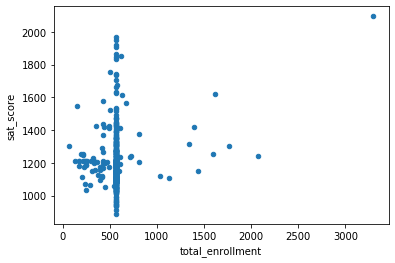

In [175]:
%matplotlib inline
full.plot.scatter(x='total_enrollment', y='sat_score')

Hmm, there is not exactly a correlation here. Its just that there is a cluster of schools with low enrollment and low sat scores. Let's try pulling up some names.

In [180]:
full.loc[(full['total_enrollment']<500)&(full['sat_score']<=1200),['name','sat_score']]

,name,sat_score
0,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,1122.0
1,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,1172.0
3,SATELLITE ACADEMY HS @ FORSYTHE STREET,1174.0
9,47 THE AMERICAN SIGN LANGUAGE AND ENGLISH DUAL L,1182.0
10,FOOD AND FINANCE HIGH SCHOOL,1194.0
11,HIGH SCHOOL FOR HISTORY & COMMUNICATION,1156.0
12,HIGH SCHOOL OF HOSPITALITY MANAGEMENT,1111.0
15,THE FACING HISTORY SCHOOL,1051.0
16,THE URBAN ASSEMBLY ACADEMY OF GOVERNMENT AND LAW,1148.0
17,LOWER MANHATTAN ARTS ACADEMY,1200.0


After spending some time on Google to understand what is common between these schools, I have realized that most of these are schools where the minority enrollment and % of economically disadvantaged students is high.
So its not actually low enrollment causing low sat scores but high % of minority students

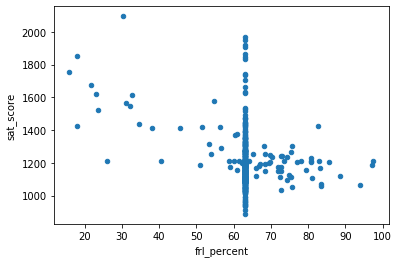

In [181]:
full.plot.scatter(x='frl_percent', y='sat_score')

As expected, there is a negative correlation between FRL percent (indicative of % of minority & economically disadvantaged class) and sat scores.
Higher the % of FRL in the school, lower is the sat score

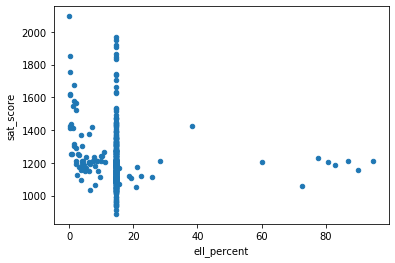

In [190]:
full.plot.scatter(x='ell_percent', y='sat_score')

It looks like there are a group of schools with a high ell_percentage that also have low average SAT scores. We can investigate this at the district level, by figuring out the percentage of English language learners in each district, and seeing it if matches our map of SAT scores by district:

In [191]:
show_district_map('ell_percent',districts_geojson)

C:\Users\Shobhit Kulshreshtha\Anaconda3\lib\site-packages\folium\folium.py:415: FutureWarning: The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.
  FutureWarning


The distinction here is not very clear, probably due to the color palette chosen. We can for sure see that there is small district right in the middle which has very high ell_percent but not high sat scores.

### Checking the correlation between survey responses and SAT Scores

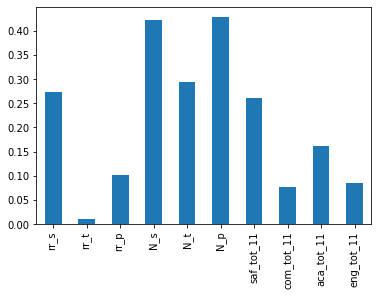

In [188]:
full.corr()["sat_score"][["rr_s", "rr_t", "rr_p", "N_s", "N_t", "N_p", "saf_tot_11", "com_tot_11", "aca_tot_11", "eng_tot_11"]].plot.bar()

The only factors having a significant correlation with sat scores here are number of parents, students, and teachers responding to the survey, and the % of students responding to the survey. As these also correlate highly with total enrollment, it makes sense to say that schools with low frl percent, also have high survey response rates (that is not our concern at the moment though)

### Exploring relationship between race and SAT scores

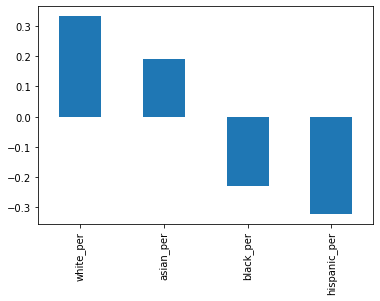

In [189]:
full.corr()["sat_score"][["white_per", "asian_per", "black_per", "hispanic_per"]].plot.bar()

From above we can conclude that higher percentage of white and asian students lead to higher sat scores and the inverse holds true for black and hispanic students. It is likely that black and hispanic students are migrants who are also learning english language and are from economically disadvantaged community
Let's look at which schools have high white_per

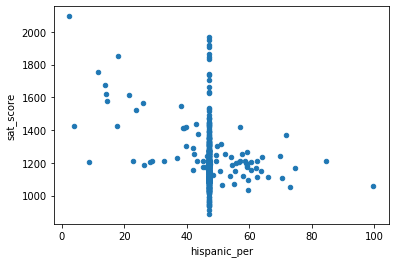

In [197]:
full.plot.scatter(x='hispanic_per',y='sat_score')

In [198]:
full.loc[(full['hispanic_per']<40)&(full['sat_score']>1400),['school_name','sat_score']]

,school_name,sat_score
6,NEW EXPLORATIONS INTO SCIENCE TECHNO,1621.0
8,BARD HIGH SCHOOL EARLY COLLEGE,1856.0
24,INSTITUTE FOR COLLABORATIVE EDUCATION,1424.0
25,PROFESSIONAL PERFORMING ARTS HIGH SCH,1522.0
26,BARUCH COLLEGE CAMPUS HIGH SCHOOL,1577.0
27,N.Y.C. LAB SCHOOL FOR COLLABORATIVE S,1677.0
28,SCHOOL OF THE FUTURE HIGH SCHOOL,1565.0
29,N.Y.C. MUSEUM SCHOOL,1419.0
30,ELEANOR ROOSEVELT HIGH SCHOOL,1758.0
31,MILLENNIUM HIGH SCHOOL,1614.0


These schools rank high in charts and host admission test and screening before admission, which is probably why hispanic_per ther is lower than others

### Gender differences in SAT scores

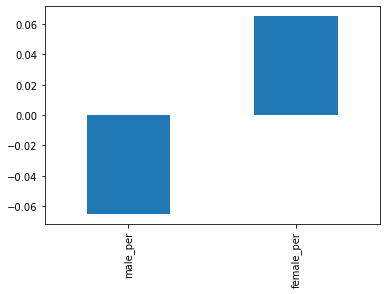

In [192]:
full.corr()["sat_score"][["male_per", "female_per"]].plot.bar()

### AP test scores & SAT scores

One last angle that we would be exploring here is the Advance Placement test and how it affects SAT scores. We already saw that number of AP test takers correlates strongly with SAT scores

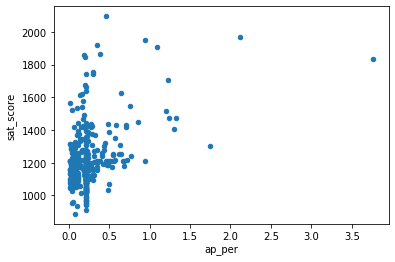

In [200]:
full['ap_per'] = full['ap_test_takers_']/full['total_enrollment']
full.plot.scatter(x='ap_per',y='sat_score')

Let's try pulling some names from the cluster in top right (excluding outliers) where sat_scores are high

In [202]:
full.loc[(full['ap_per']>0.3)&(full['sat_score']>1400),['school_name','sat_score']]

,school_name,sat_score
30,ELEANOR ROOSEVELT HIGH SCHOOL,1758.0
41,STUYVESANT HIGH SCHOOL,2096.0
55,URBAN ACADEMY LABORATORY HIGH SCHOOL,1547.0
74,FIORELLO H. LAGUARDIA HIGH SCHOOL OF,1707.0
81,MANHATTAN CENTER FOR SCIENCE AND MATH,1430.0
175,NaN,1969.0
182,NaN,1920.0
220,NaN,1833.0
275,NaN,1436.0
313,NaN,1431.0


Some Google searching reveals that these are mostly highly selective schools where you need to take a test to get in. It makes sense that these schools would have high proportions of AP test takers.

# THE END!

###### This is all that we are going to cover as part of this project. I would like to thank [DataQuest.io](www.dataquest.io) for guiding me through the project.